In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

# Data Preprocessing

In [2]:
current_directory = os.getcwd()
df = pd.DataFrame()
df = pd.read_csv(os.path.join(os.path.dirname(current_directory), 'Data Collecting','banjarbaru_climate_data.csv'), delimiter=';')

In [3]:
df

,Unnamed: 0,date,RR,Tn,Tx,Tavg,RH_avg,ss,ff_x,ff_avg,ddd_x,ddd_car
0,238468,01/01/2010,2.2,24.2,31.0,26.3,92.0,4.8,3.0,2.0,270.0,E
1,238469,01/02/2010,2.2,24.4,NaN,25.7,94.0,3.9,4.0,2.0,135.0,NW
2,238470,01/03/2010,19.6,24.2,31.4,26.9,86.0,4.2,3.0,2.0,360.0,N
3,238471,01/04/2010,NaN,24.8,30.6,26.7,91.0,1.1,4.0,2.0,270.0,N
4,238472,01/05/2010,23.4,24.0,NaN,25.7,92.0,0.0,5.0,3.0,270.0,NE
...,...,...,...,...,...,...,...,...,...,...,...,...
3845,242313,27/12/2020,0.3,23.8,31.7,NaN,NaN,1.4,3.0,1.0,180.0,SW
3846,242314,28/12/2020,4.9,24.4,32.0,NaN,NaN,6.3,4.0,2.0,200.0,C
3847,242315,29/12/2020,12.7,24.3,29.0,NaN,NaN,9.1,2.0,1.0,300.0,C
3848,242316,30/12/2020,1.9,24.0,30.0,NaN,NaN,0.0,3.0,2.0,250.0,W


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3850 entries, 0 to 3849
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  3850 non-null   int64  
 1   date        3850 non-null   object 
 2   RR          2565 non-null   float64
 3   Tn          3749 non-null   float64
 4   Tx          3750 non-null   float64
 5   Tavg        1826 non-null   float64
 6   RH_avg      1824 non-null   float64
 7   ss          3749 non-null   float64
 8   ff_x        3820 non-null   float64
 9   ff_avg      3818 non-null   float64
 10  ddd_x       3820 non-null   float64
 11  ddd_car     3820 non-null   object 
dtypes: float64(9), int64(1), object(2)
memory usage: 361.1+ KB


In [5]:
# Makes the date index
df.set_index('date', inplace=True)
df.index = pd.to_datetime(df.index)

C:\Users\Gerda\AppData\Local\Temp\ipykernel_7780\1410338821.py:3: UserWarning: Parsing '13/01/2010' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  df.index = pd.to_datetime(df.index)
C:\Users\Gerda\AppData\Local\Temp\ipykernel_7780\1410338821.py:3: UserWarning: Parsing '14/01/2010' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  df.index = pd.to_datetime(df.index)
C:\Users\Gerda\AppData\Local\Temp\ipykernel_7780\1410338821.py:3: UserWarning: Parsing '15/01/2010' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  df.index = pd.to_datetime(df.index)
C:\Users\Gerda\AppData\Local\Temp\ipykernel_7780\1410338821.py:3: UserWarning: Parsing '16/01/2010' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  df.index = pd.to_datetime(df.index)
C:\Users\Gerda\AppData\Local\Temp\ipykernel_7780\141

In [6]:
# Take the required value
columns = ['RR', 'Tn', 'Tx', 'Tavg', 'RH_avg', 'ss', 'ff_x', 'ff_avg', 'ddd_x', 'ddd_car']
df = df[columns]

In [7]:
df

,RR,Tn,Tx,Tavg,RH_avg,ss,ff_x,ff_avg,ddd_x,ddd_car
date,,,,,,,,,,
2010-01-01,2.2,24.2,31.0,26.3,92.0,4.8,3.0,2.0,270.0,E
2010-01-02,2.2,24.4,NaN,25.7,94.0,3.9,4.0,2.0,135.0,NW
2010-01-03,19.6,24.2,31.4,26.9,86.0,4.2,3.0,2.0,360.0,N
2010-01-04,NaN,24.8,30.6,26.7,91.0,1.1,4.0,2.0,270.0,N
2010-01-05,23.4,24.0,NaN,25.7,92.0,0.0,5.0,3.0,270.0,NE
...,...,...,...,...,...,...,...,...,...,...
2020-12-27,0.3,23.8,31.7,NaN,NaN,1.4,3.0,1.0,180.0,SW
2020-12-28,4.9,24.4,32.0,NaN,NaN,6.3,4.0,2.0,200.0,C
2020-12-29,12.7,24.3,29.0,NaN,NaN,9.1,2.0,1.0,300.0,C


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3850 entries, 2010-01-01 to 2020-12-31
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   RR       2565 non-null   float64
 1   Tn       3749 non-null   float64
 2   Tx       3750 non-null   float64
 3   Tavg     1826 non-null   float64
 4   RH_avg   1824 non-null   float64
 5   ss       3749 non-null   float64
 6   ff_x     3820 non-null   float64
 7   ff_avg   3818 non-null   float64
 8   ddd_x    3820 non-null   float64
 9   ddd_car  3820 non-null   object 
dtypes: float64(9), object(1)
memory usage: 330.9+ KB


## Numeric Code Generation

In [9]:
df['ddd_car'].unique()

array(['E ', 'NW', 'N ', 'NE', 'S ', 'SE', 'W ', 'SW', nan, 'C '],
      dtype=object)

In [10]:
df['ddd_car'] = df['ddd_car'].str.replace(' ', '')

wind_dir_code = df['ddd_car'].astype('category')
wind_dir_code = dict(enumerate(wind_dir_code.cat.categories))
wind_dir_code

C:\Users\Gerda\AppData\Local\Temp\ipykernel_7780\2814879749.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ddd_car'] = df['ddd_car'].str.replace(' ', '')


{0: 'C', 1: 'E', 2: 'N', 3: 'NE', 4: 'NW', 5: 'S', 6: 'SE', 7: 'SW', 8: 'W'}

In [11]:
df['ddd_car'] = df.ddd_car.astype('category').cat.codes

C:\Users\Gerda\AppData\Local\Temp\ipykernel_7780\3307600119.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ddd_car'] = df.ddd_car.astype('category').cat.codes


In [12]:
df['ddd_car'].unique()

array([ 1,  4,  2,  3,  5,  6,  8,  7, -1,  0], dtype=int8)

In [13]:
df['ddd_car'].replace(-1, np.nan, inplace=True)

C:\Users\Gerda\AppData\Local\Temp\ipykernel_7780\3693992957.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ddd_car'].replace(-1, np.nan, inplace=True)


In [14]:
df

,RR,Tn,Tx,Tavg,RH_avg,ss,ff_x,ff_avg,ddd_x,ddd_car
date,,,,,,,,,,
2010-01-01,2.2,24.2,31.0,26.3,92.0,4.8,3.0,2.0,270.0,1.0
2010-01-02,2.2,24.4,NaN,25.7,94.0,3.9,4.0,2.0,135.0,4.0
2010-01-03,19.6,24.2,31.4,26.9,86.0,4.2,3.0,2.0,360.0,2.0
2010-01-04,NaN,24.8,30.6,26.7,91.0,1.1,4.0,2.0,270.0,2.0
2010-01-05,23.4,24.0,NaN,25.7,92.0,0.0,5.0,3.0,270.0,3.0
...,...,...,...,...,...,...,...,...,...,...
2020-12-27,0.3,23.8,31.7,NaN,NaN,1.4,3.0,1.0,180.0,7.0
2020-12-28,4.9,24.4,32.0,NaN,NaN,6.3,4.0,2.0,200.0,0.0
2020-12-29,12.7,24.3,29.0,NaN,NaN,9.1,2.0,1.0,300.0,0.0


## Missing Value check

In [15]:
#Isnull Value info
def missing_value_table(df):
    missing_value = df.isna().sum().sort_values(ascending=False)
    missing_value_percent = 100 * df.isna().sum()//len(df)
    missing_value_table = pd.concat([missing_value, missing_value_percent], axis=1)
    missing_value_table_return = missing_value_table.rename(columns = {0 : 'Missing Values', 1 : '% Value'})
    cm = sns.light_palette("red", as_cmap=True)
    missing_value_table_return = missing_value_table_return.style.background_gradient(cmap=cm)
    return missing_value_table_return

In [16]:
missing_value_table(df)

,Missing Values,% Value
RH_avg,2026,52
Tavg,2024,52
RR,1285,33
Tn,101,2
ss,101,2
Tx,100,2
ff_avg,32,0
ff_x,30,0
ddd_x,30,0
ddd_car,30,0


The RH_avg and Tavg columns have a missing value > 50% so these columns are deleted

In [17]:
columns = ['RR', 'Tn', 'Tx', 'ss', 'ff_x', 'ff_avg', 'ddd_x', 'ddd_car']
df = df[columns]

In [18]:
def sort_data_by_date(df):
    """
     Sort data by index with date format.

     Args:
     - df: DataFrame that contains data

     Returns:
     - DataFrame that has been sorted by index with date format.
     """
    df_sorted = df.copy()
    df_sorted.index = pd.to_datetime(df_sorted.index, format='%d-%m-%Y')
    df_sorted = df_sorted.sort_index()
    df_sorted.index = df_sorted.index.strftime('%d/%m/%Y')
    return df_sorted

df_sorted = sort_data_by_date(df)

In [19]:
df

,RR,Tn,Tx,ss,ff_x,ff_avg,ddd_x,ddd_car
date,,,,,,,,
2010-01-01,2.2,24.2,31.0,4.8,3.0,2.0,270.0,1.0
2010-01-02,2.2,24.4,NaN,3.9,4.0,2.0,135.0,4.0
2010-01-03,19.6,24.2,31.4,4.2,3.0,2.0,360.0,2.0
2010-01-04,NaN,24.8,30.6,1.1,4.0,2.0,270.0,2.0
2010-01-05,23.4,24.0,NaN,0.0,5.0,3.0,270.0,3.0
...,...,...,...,...,...,...,...,...
2020-12-27,0.3,23.8,31.7,1.4,3.0,1.0,180.0,7.0
2020-12-28,4.9,24.4,32.0,6.3,4.0,2.0,200.0,0.0
2020-12-29,12.7,24.3,29.0,9.1,2.0,1.0,300.0,0.0


In [20]:
import matplotlib.pyplot as plt
import math

def plot_df(df, part_size):
    """
     Splitting the dataframe into parts and creating plots for each part.

     Args:
     - df: DataFrame that contains data
     - part_size: size of each part of the dataframe

     Returns:
     - Does not return a value, only displays plots for each piece of data.
     """
    
    len_columns = df.shape[1]
    groups = [i for i in range(len_columns)]

    num_parts = math.ceil(len(df) / part_size)
    
    for part_num in range(num_parts):
        start = part_num * part_size
        end = min((part_num + 1) * part_size, len(df))
        part_df = df.iloc[start:end]

        plt.figure(figsize=(20, 13))

        i = 1
        for group in groups:
            plt.subplot(len(groups), 1, i)
            plt.plot(part_df.iloc[:, group])
            plt.title(df.columns[group], y=0.5, loc='right')
            i += 1
        plt.show()


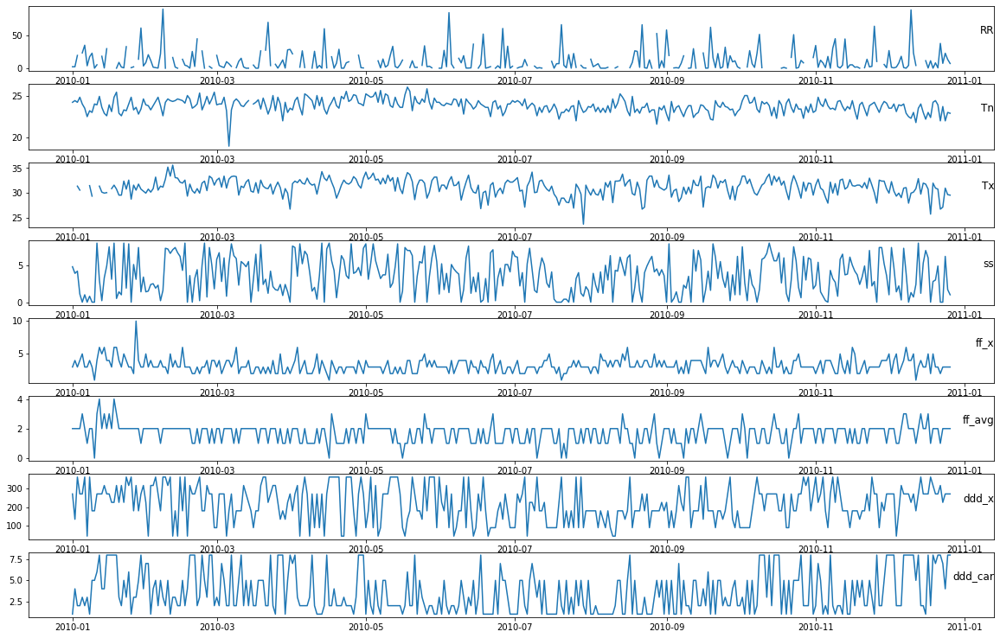

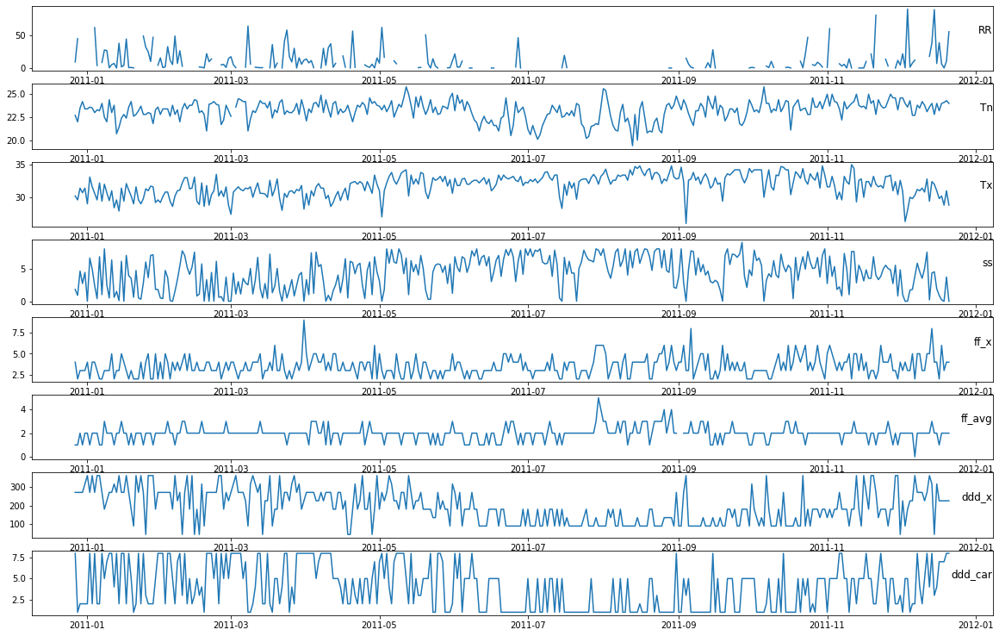

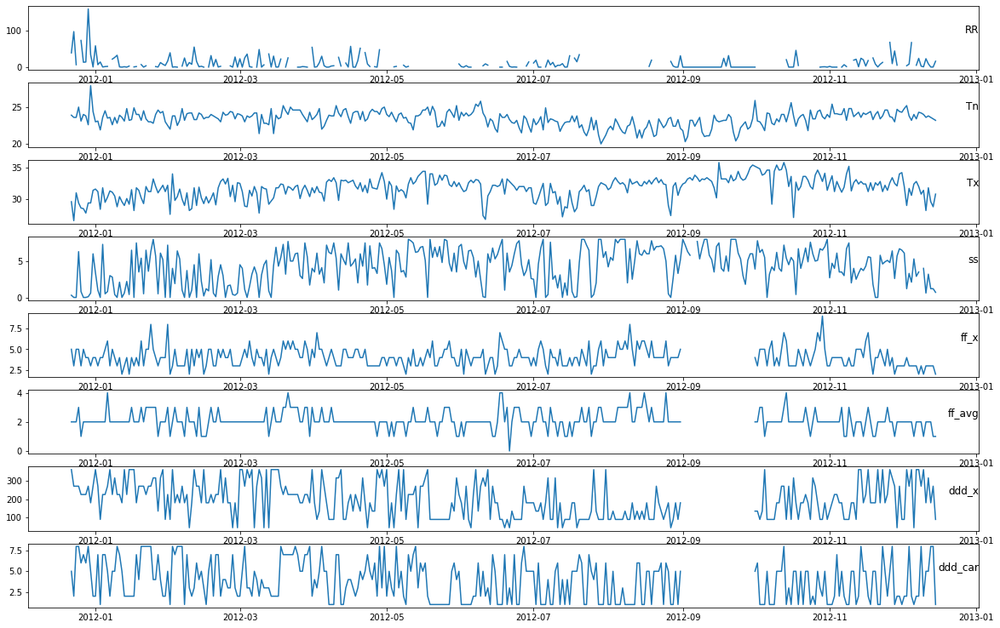

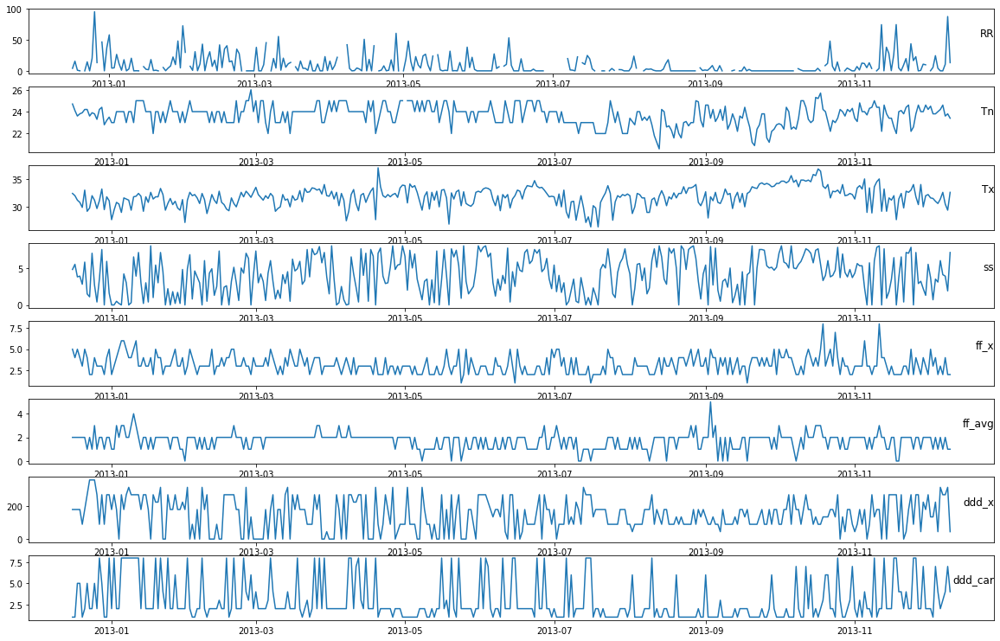

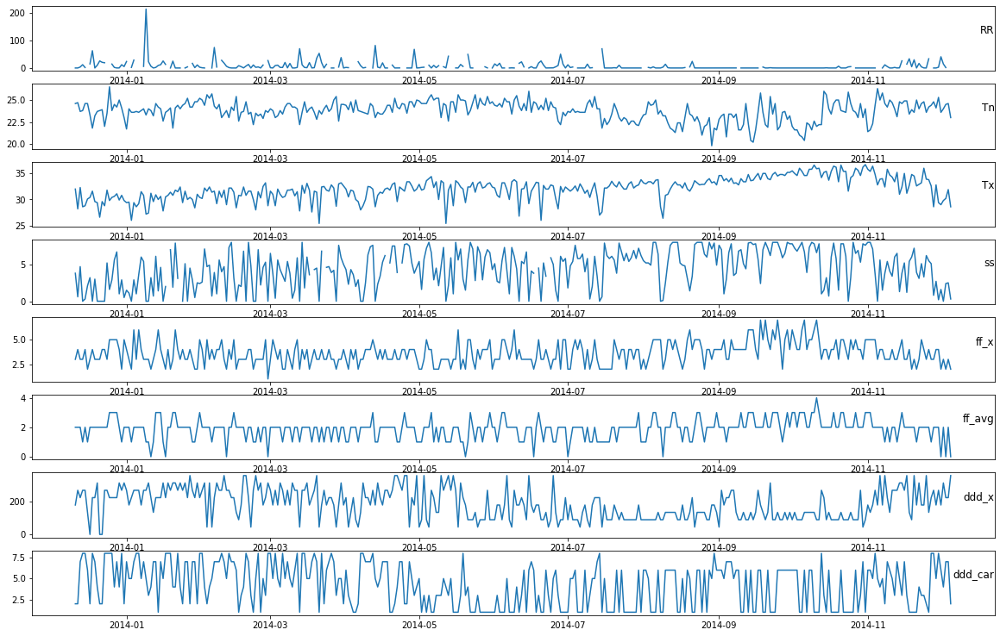

...

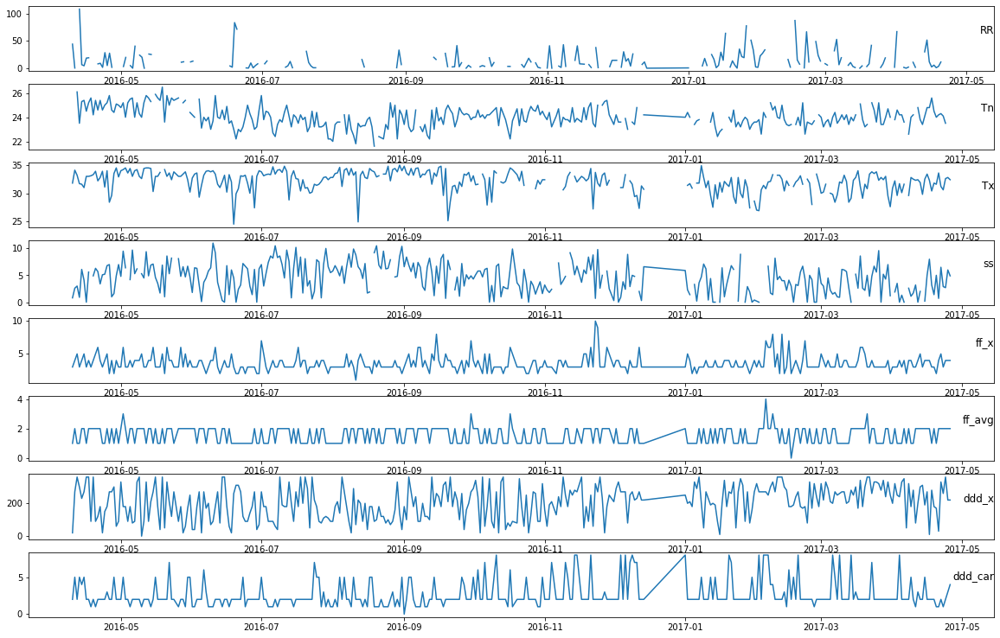

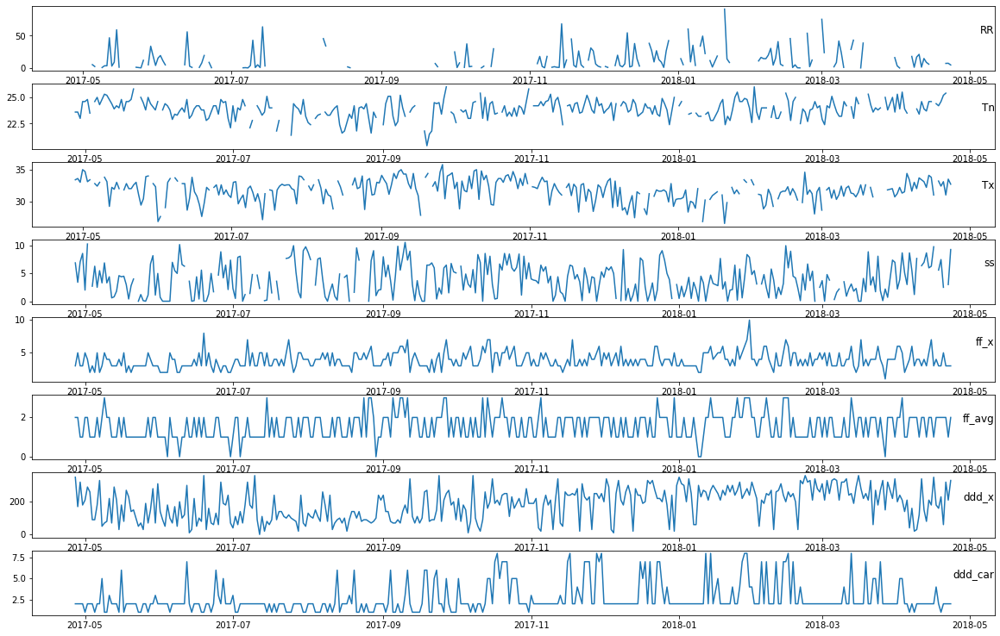

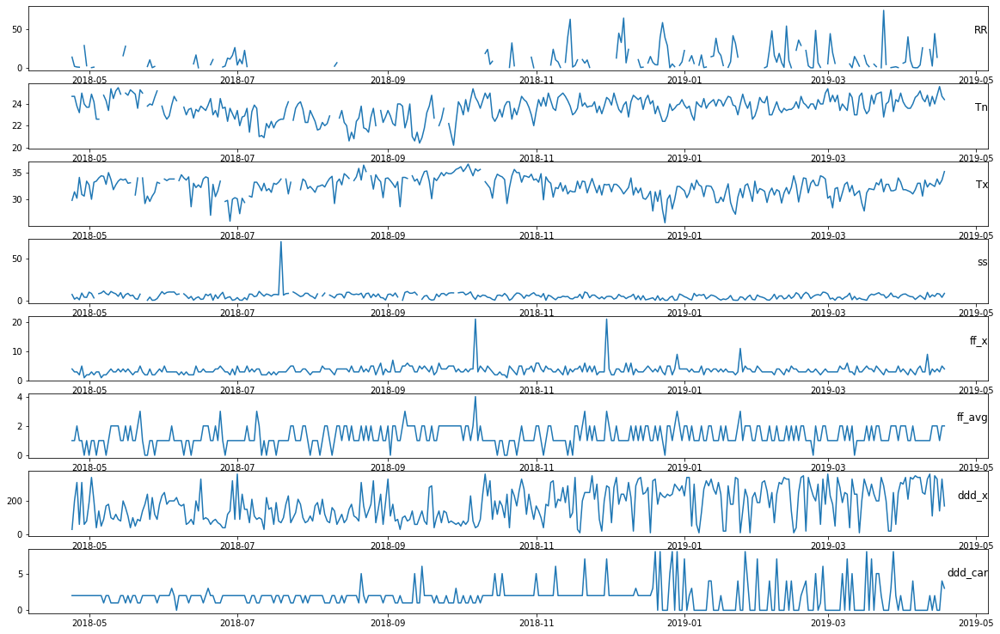

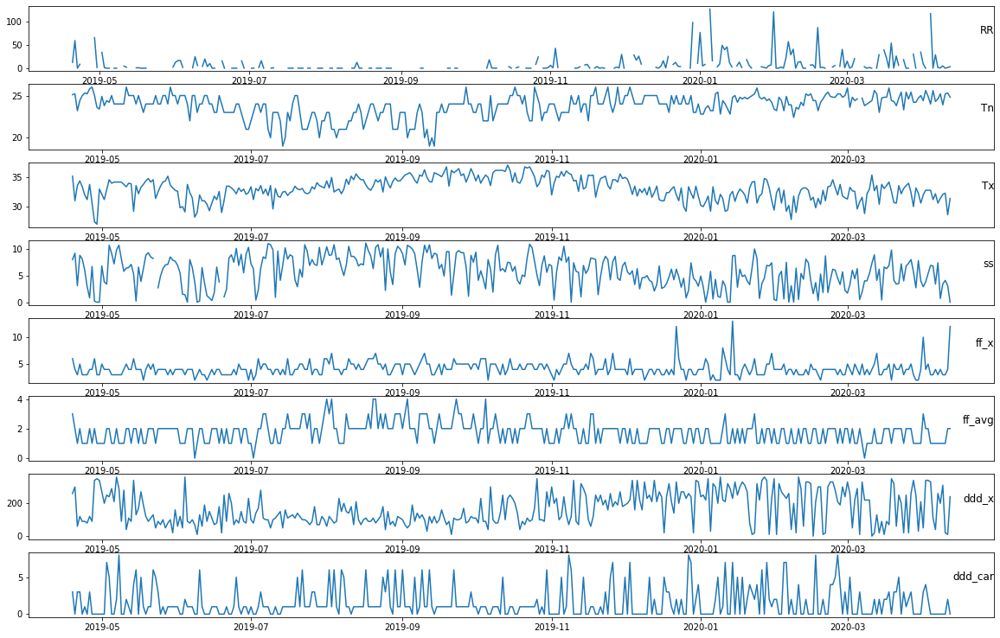

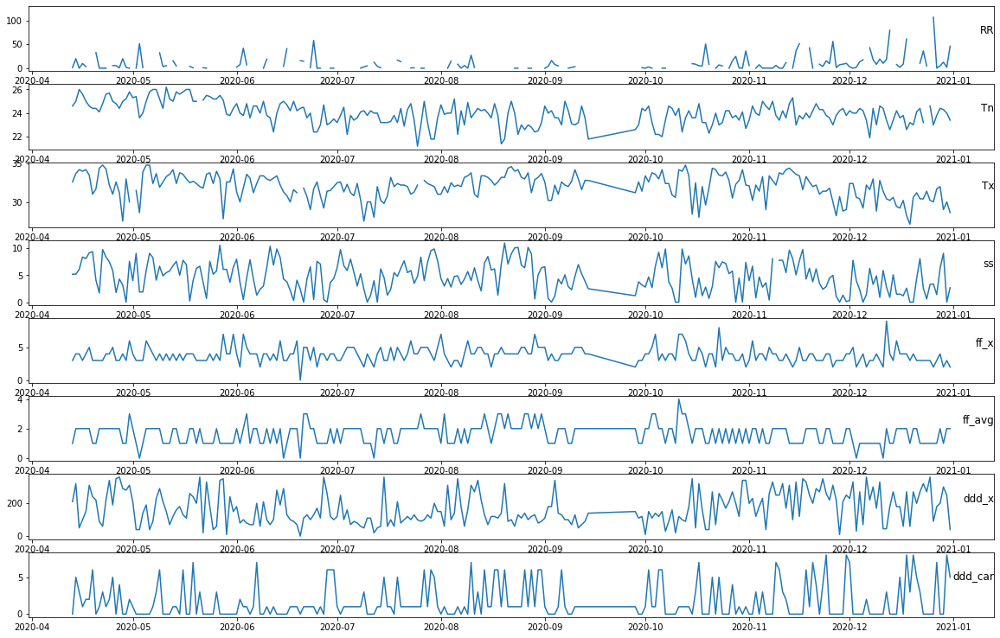

In [21]:
plot_df(df, 360)

In [22]:
missing_value_table(df)

,Missing Values,% Value
RR,1285,33
Tn,101,2
ss,101,2
Tx,100,2
ff_avg,32,0
ff_x,30,0
ddd_x,30,0
ddd_car,30,0


The RR column which shows rainfall has a missing value of 33%, so it is necessary to consider whether the empty value row is omitted or filled in.

This study will use 2 different methods to overcome missing values, namely deleting empty rows and filling in rows in empty columns with a value of 0.

In [23]:
df_clean = df.copy()
df_filled = df.copy()

In [24]:
df_clean = df_clean.dropna(subset=['RR'])
df_filled['RR'] = df_filled['RR'].fillna(0)

In [25]:
df_clean

,RR,Tn,Tx,ss,ff_x,ff_avg,ddd_x,ddd_car
date,,,,,,,,
2010-01-01,2.2,24.2,31.0,4.8,3.0,2.0,270.0,1.0
2010-01-02,2.2,24.4,NaN,3.9,4.0,2.0,135.0,4.0
2010-01-03,19.6,24.2,31.4,4.2,3.0,2.0,360.0,2.0
2010-01-05,23.4,24.0,NaN,0.0,5.0,3.0,270.0,3.0
2010-01-06,35.2,23.5,30.6,1.0,3.0,2.0,360.0,2.0
...,...,...,...,...,...,...,...,...
2020-12-27,0.3,23.8,31.7,1.4,3.0,1.0,180.0,7.0
2020-12-28,4.9,24.4,32.0,6.3,4.0,2.0,200.0,0.0
2020-12-29,12.7,24.3,29.0,9.1,2.0,1.0,300.0,0.0


In [26]:
df_filled

,RR,Tn,Tx,ss,ff_x,ff_avg,ddd_x,ddd_car
date,,,,,,,,
2010-01-01,2.2,24.2,31.0,4.8,3.0,2.0,270.0,1.0
2010-01-02,2.2,24.4,NaN,3.9,4.0,2.0,135.0,4.0
2010-01-03,19.6,24.2,31.4,4.2,3.0,2.0,360.0,2.0
2010-01-04,0.0,24.8,30.6,1.1,4.0,2.0,270.0,2.0
2010-01-05,23.4,24.0,NaN,0.0,5.0,3.0,270.0,3.0
...,...,...,...,...,...,...,...,...
2020-12-27,0.3,23.8,31.7,1.4,3.0,1.0,180.0,7.0
2020-12-28,4.9,24.4,32.0,6.3,4.0,2.0,200.0,0.0
2020-12-29,12.7,24.3,29.0,9.1,2.0,1.0,300.0,0.0


In [27]:
missing_value_table(df_clean)

,Missing Values,% Value
Tx,51,1
Tn,49,1
ss,47,1
ff_avg,31,1
ff_x,30,1
ddd_x,30,1
ddd_car,30,1
RR,0,0


In [28]:
missing_value_table(df_filled)

,Missing Values,% Value
Tn,101,2
ss,101,2
Tx,100,2
ff_avg,32,0
ff_x,30,0
ddd_x,30,0
ddd_car,30,0
RR,0,0


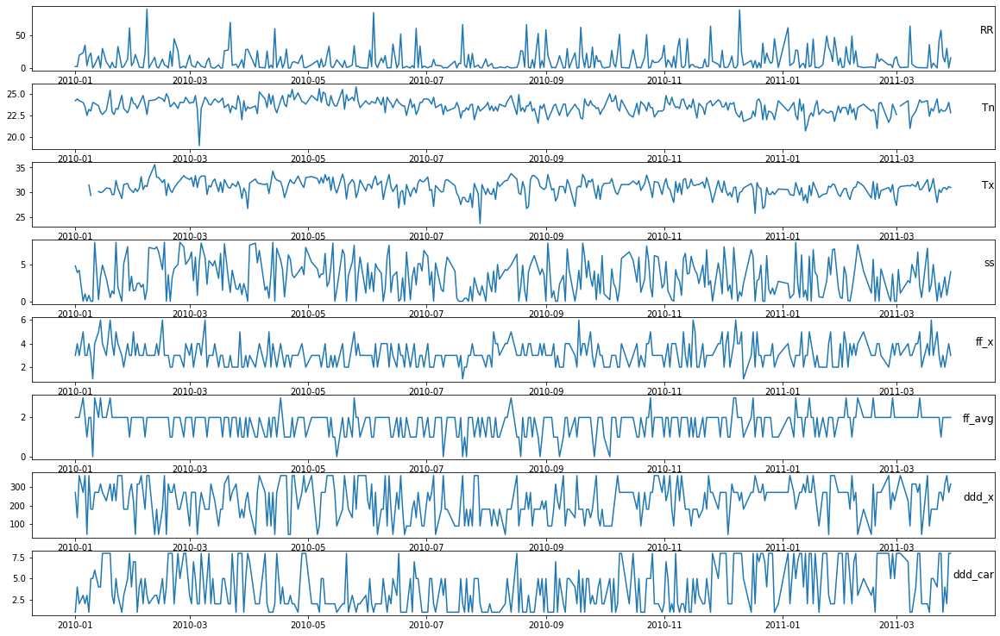

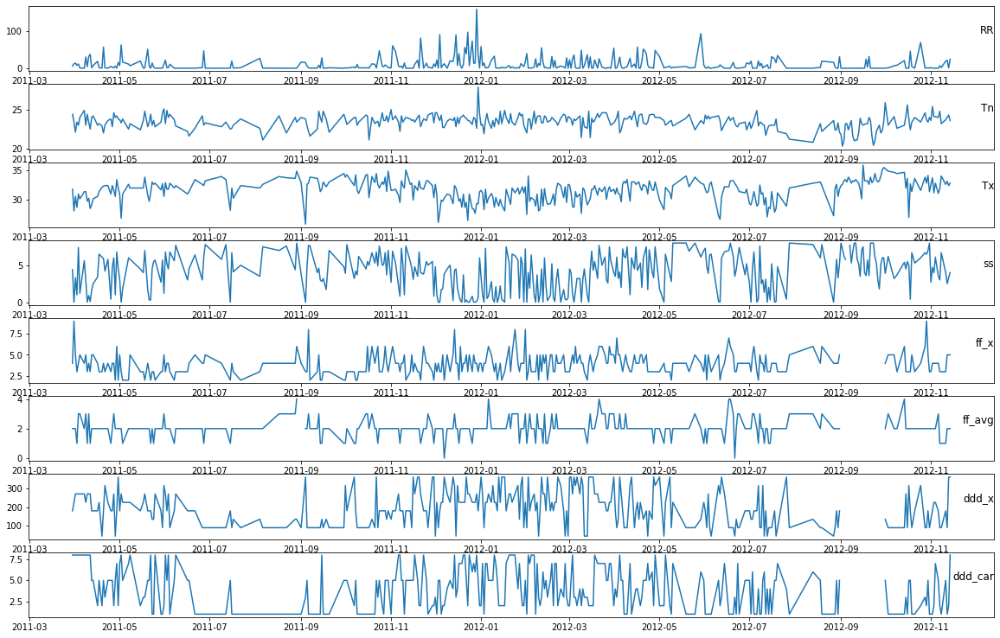

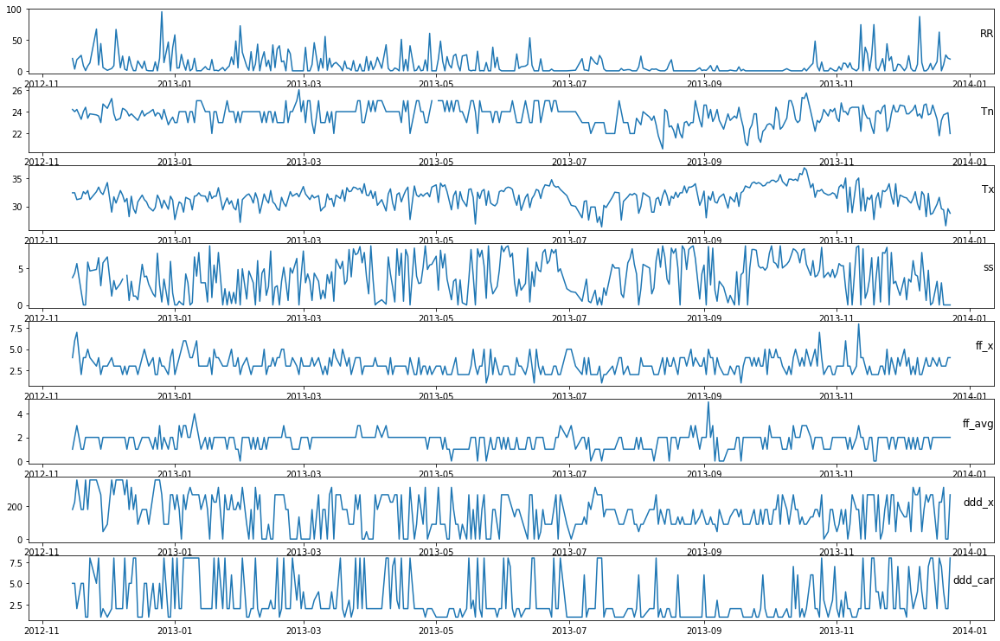

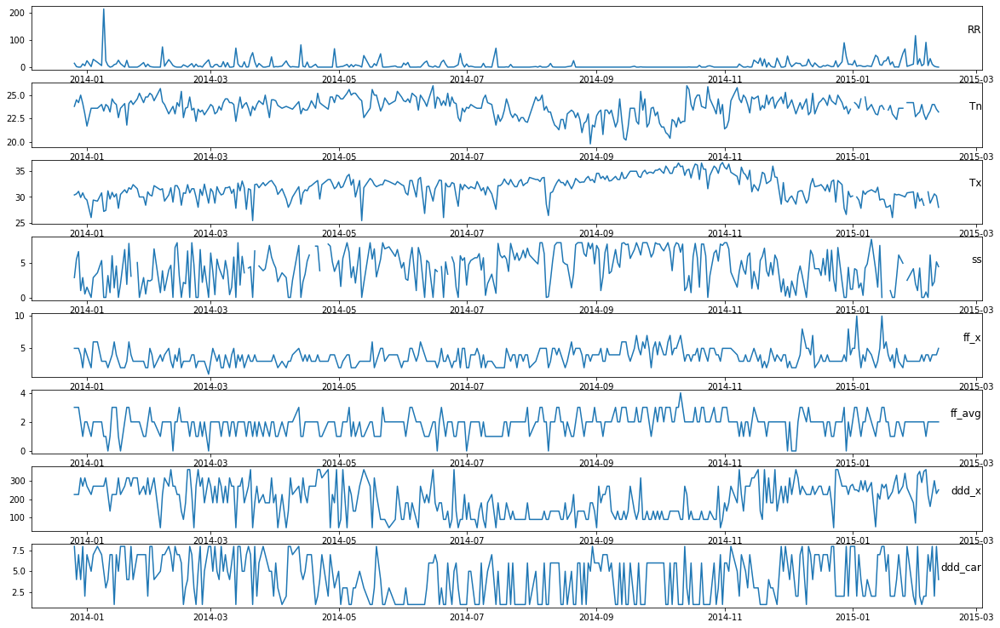

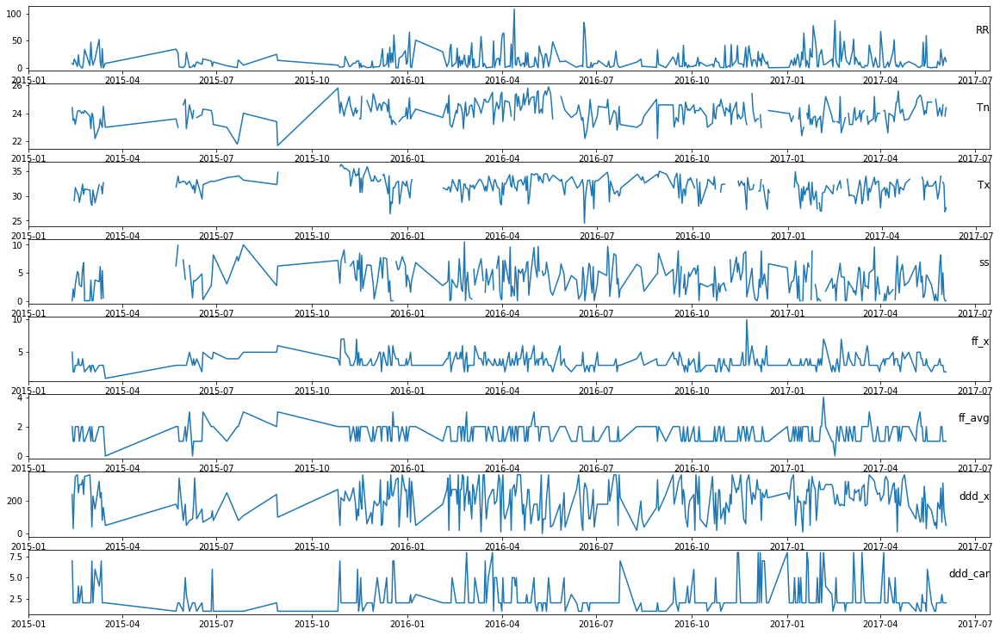

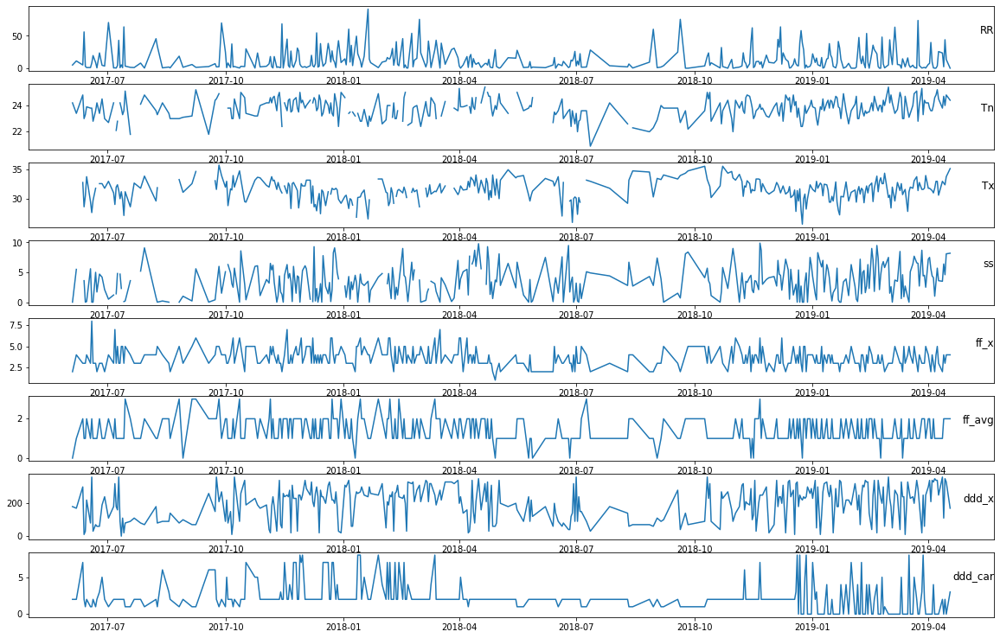

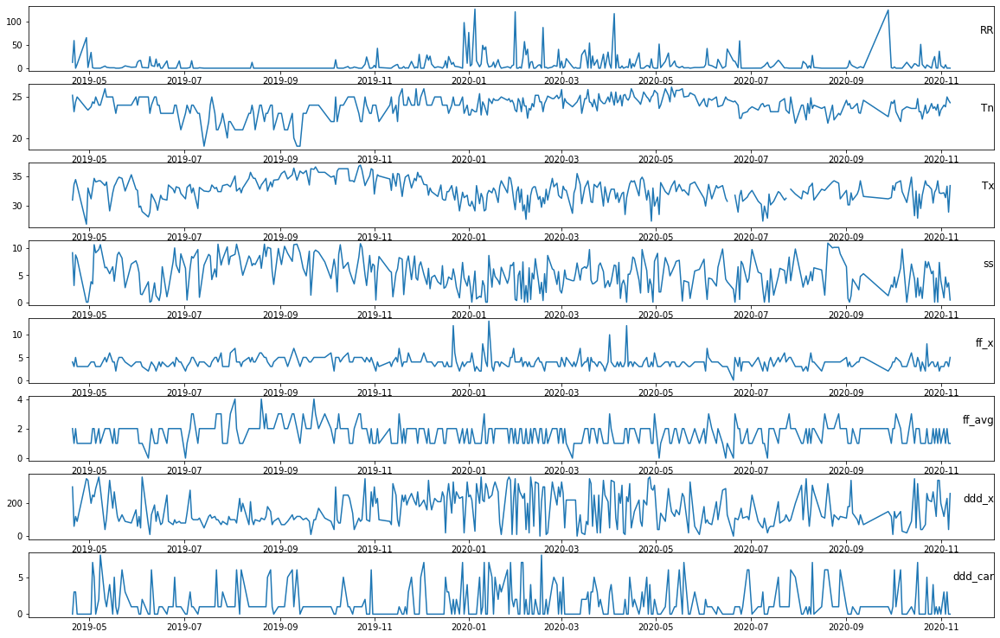

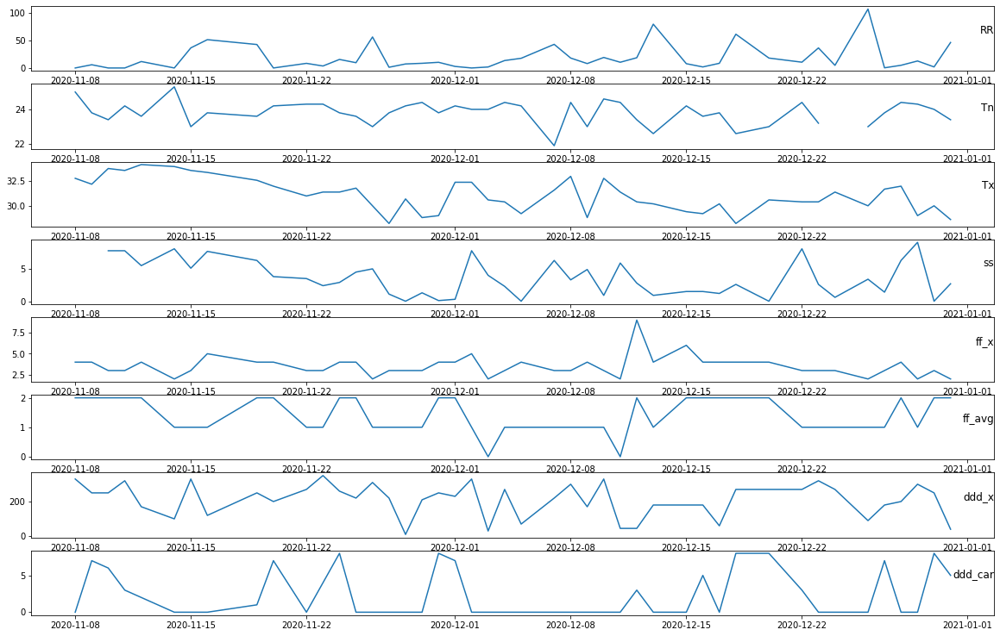

In [29]:
plot_df(df_clean, 360)

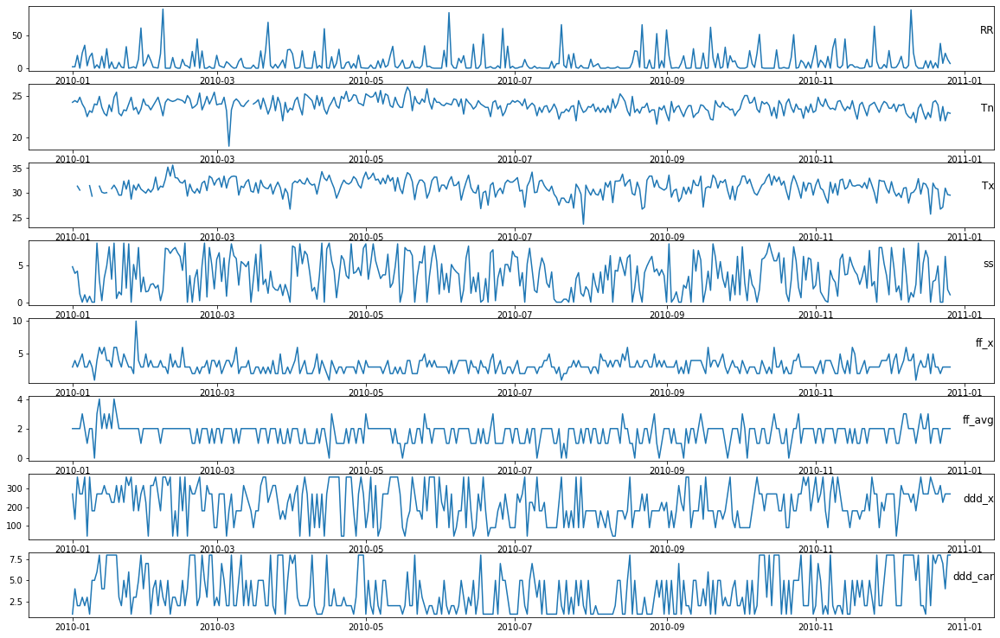

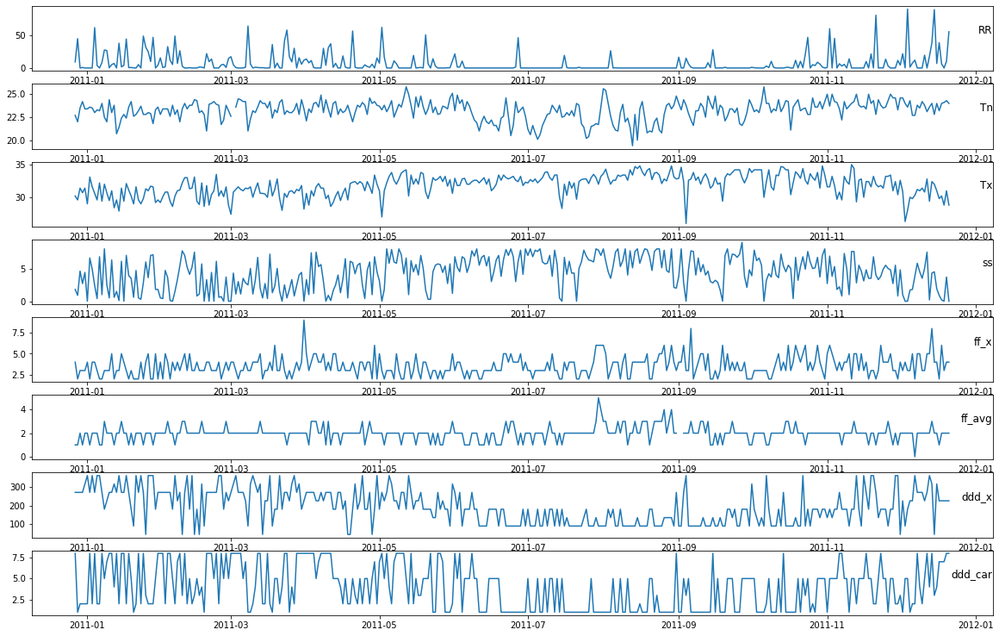

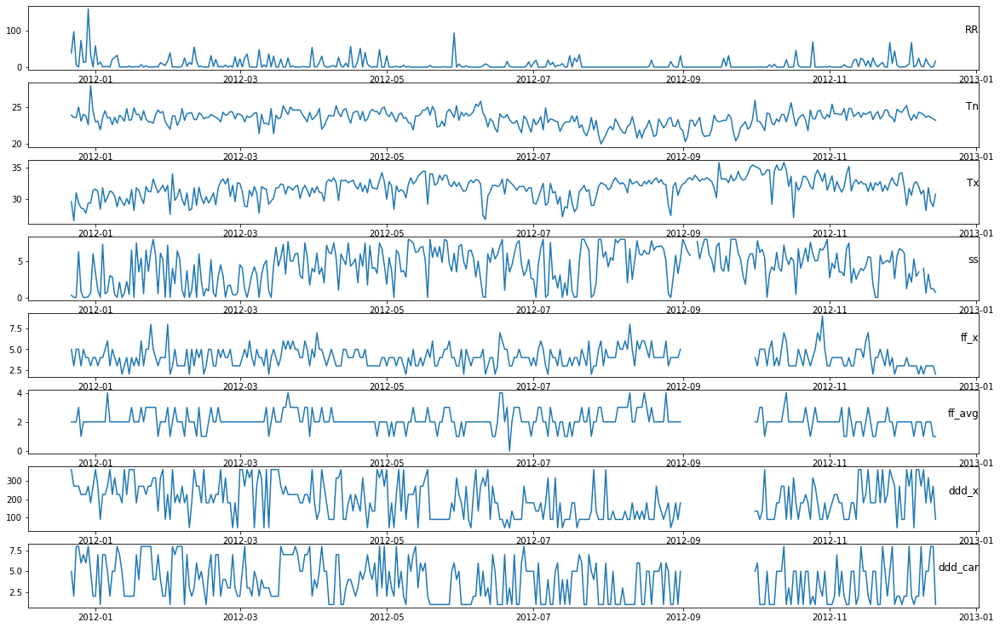

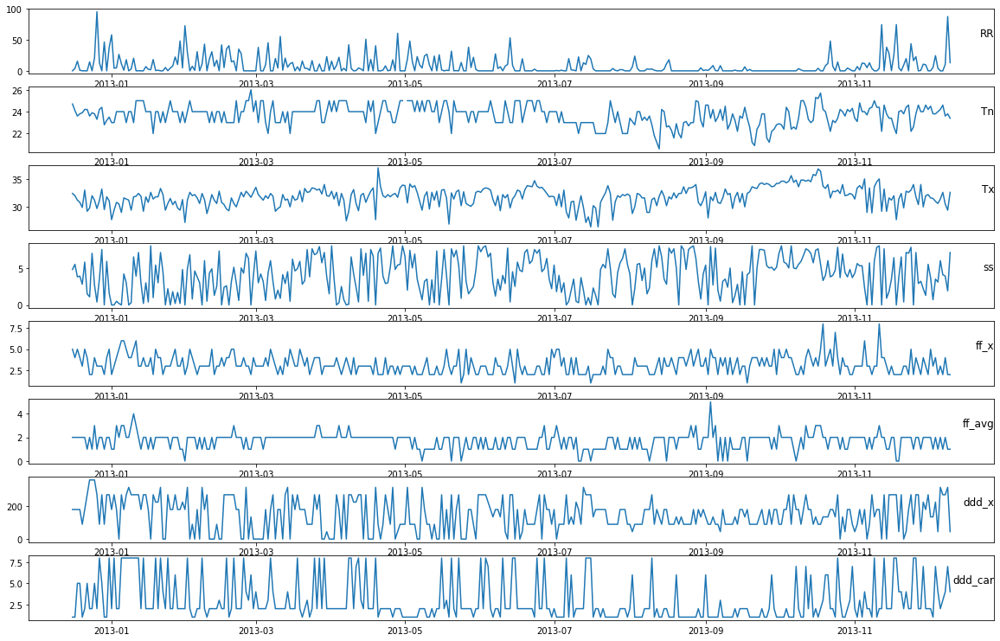

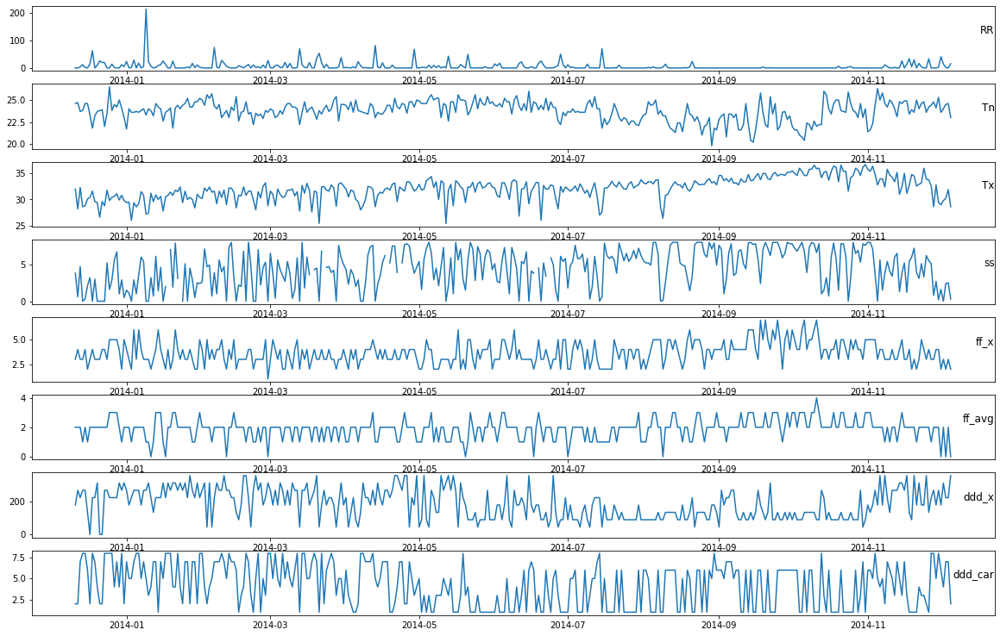

...

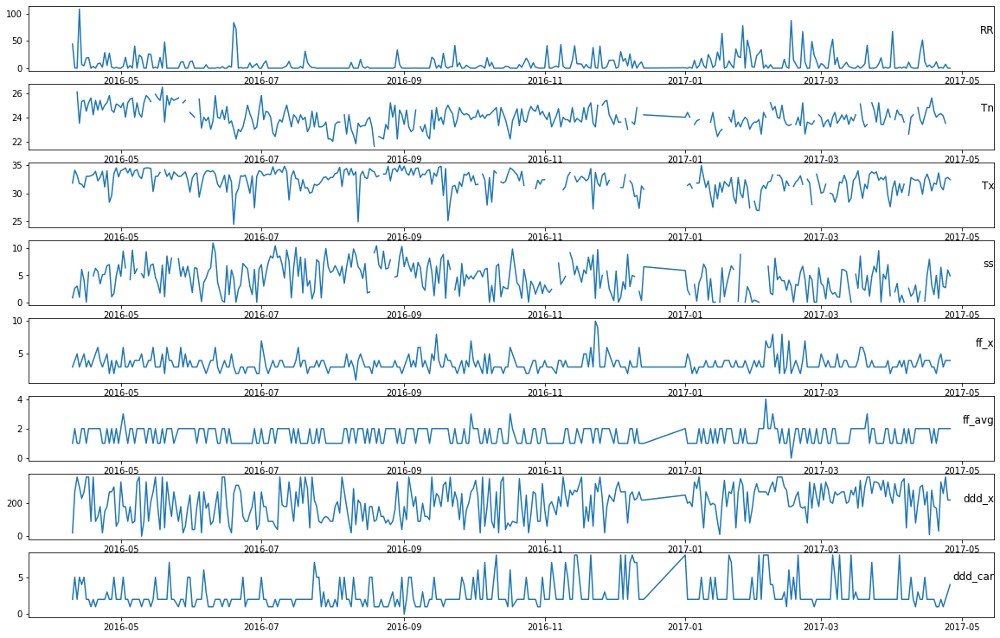

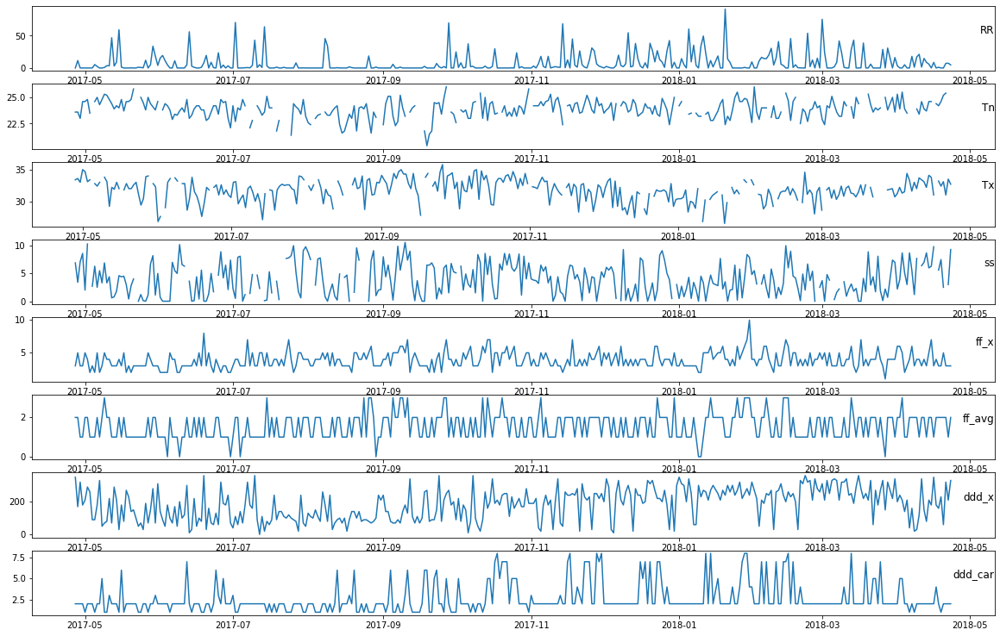

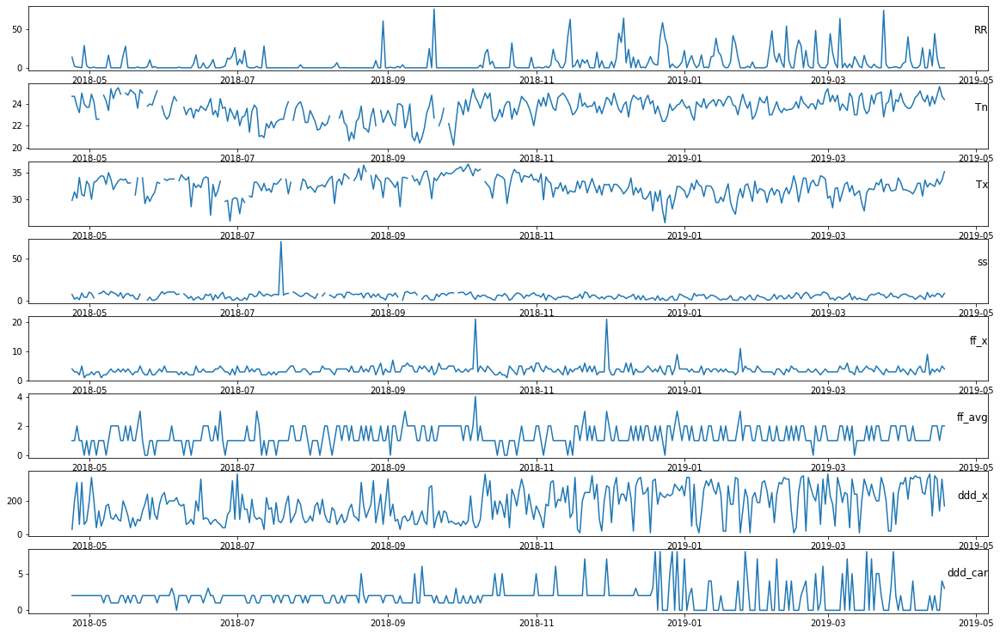

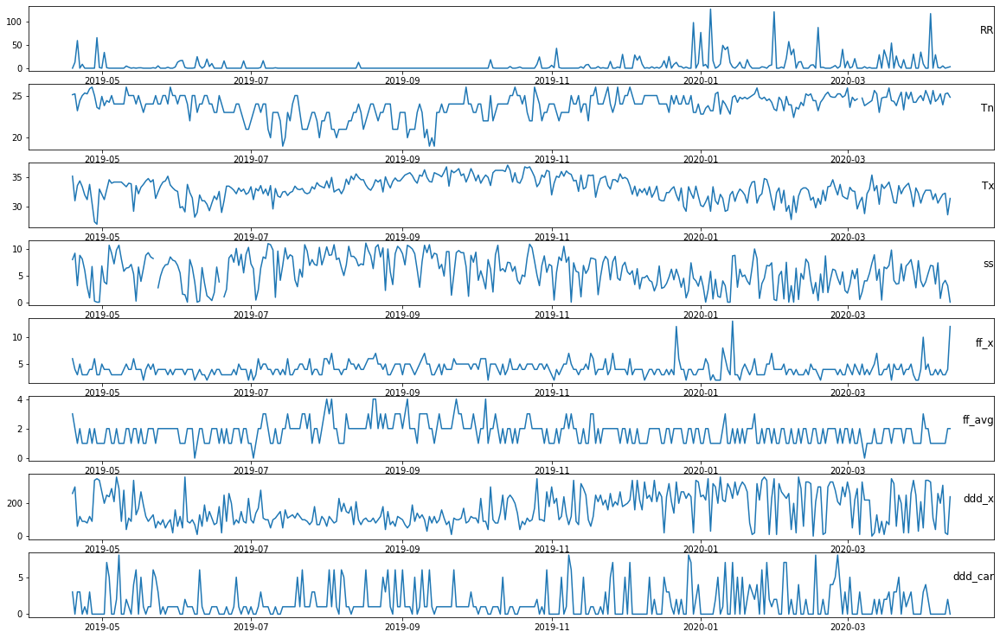

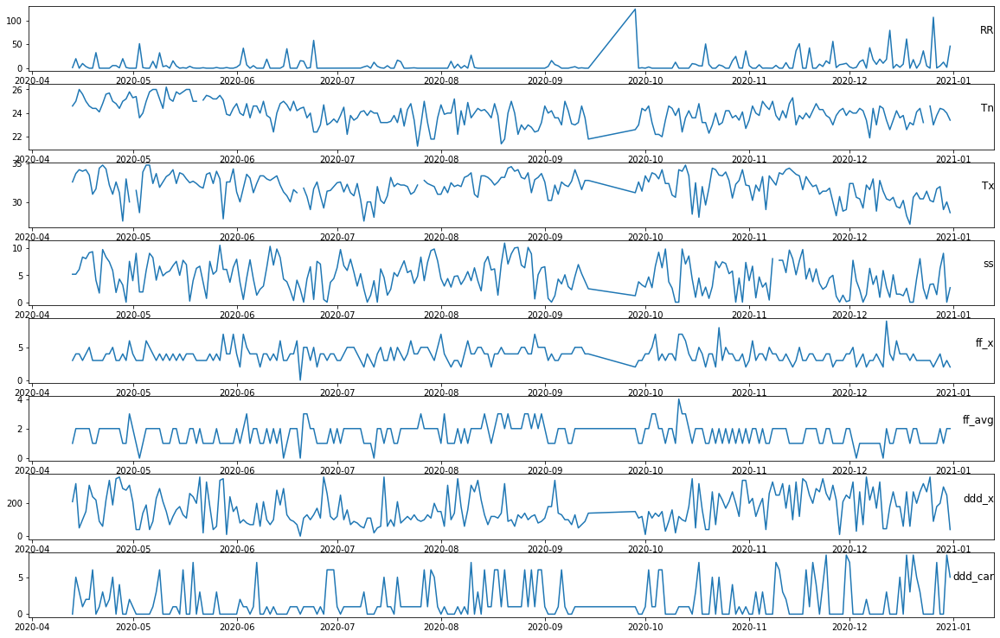

In [30]:
plot_df(df_filled, 360)

In [31]:
df_clean = df_clean.dropna()
df_filled = df_filled.dropna()

In [32]:
missing_value_table(df_clean)

,Missing Values,% Value
RR,0,0
Tn,0,0
Tx,0,0
ss,0,0
ff_x,0,0
ff_avg,0,0
ddd_x,0,0
ddd_car,0,0


In [33]:
missing_value_table(df_filled)

,Missing Values,% Value
RR,0,0
Tn,0,0
Tx,0,0
ss,0,0
ff_x,0,0
ff_avg,0,0
ddd_x,0,0
ddd_car,0,0


In [34]:
df_clean

,RR,Tn,Tx,ss,ff_x,ff_avg,ddd_x,ddd_car
date,,,,,,,,
2010-01-01,2.2,24.2,31.0,4.8,3.0,2.0,270.0,1.0
2010-01-03,19.6,24.2,31.4,4.2,3.0,2.0,360.0,2.0
2010-01-06,35.2,23.5,30.6,1.0,3.0,2.0,360.0,2.0
2010-01-08,17.4,23.2,31.5,0.8,4.0,2.0,360.0,1.0
2010-01-09,23.0,23.0,29.4,0.0,3.0,2.0,180.0,5.0
...,...,...,...,...,...,...,...,...
2020-12-27,0.3,23.8,31.7,1.4,3.0,1.0,180.0,7.0
2020-12-28,4.9,24.4,32.0,6.3,4.0,2.0,200.0,0.0
2020-12-29,12.7,24.3,29.0,9.1,2.0,1.0,300.0,0.0


In [35]:
df_filled

,RR,Tn,Tx,ss,ff_x,ff_avg,ddd_x,ddd_car
date,,,,,,,,
2010-01-01,2.2,24.2,31.0,4.8,3.0,2.0,270.0,1.0
2010-01-03,19.6,24.2,31.4,4.2,3.0,2.0,360.0,2.0
2010-01-04,0.0,24.8,30.6,1.1,4.0,2.0,270.0,2.0
2010-01-06,35.2,23.5,30.6,1.0,3.0,2.0,360.0,2.0
2010-01-08,17.4,23.2,31.5,0.8,4.0,2.0,360.0,1.0
...,...,...,...,...,...,...,...,...
2020-12-27,0.3,23.8,31.7,1.4,3.0,1.0,180.0,7.0
2020-12-28,4.9,24.4,32.0,6.3,4.0,2.0,200.0,0.0
2020-12-29,12.7,24.3,29.0,9.1,2.0,1.0,300.0,0.0


## Selection of Features Based on Correlation Matrix Calculations

In [36]:
# Plotting Correlation Matrix
def plot_correlation_matrix(corrM):
    plt.figure(figsize=(8, 6))
    sns.heatmap(corrM, annot=True, cmap='coolwarm')
    plt.title('Correlation Matrix')
    plt.show()

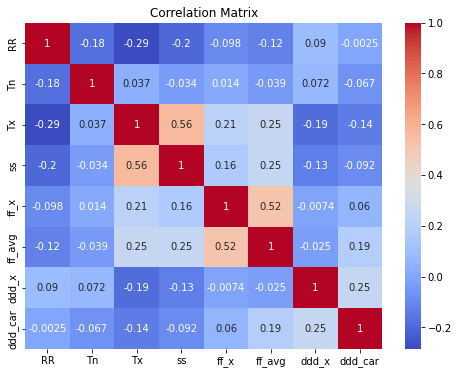

In [37]:
# Counting Correlation Matrix
corrM_df_clean = df_clean.corr()
plot_correlation_matrix(corrM=corrM_df_clean)

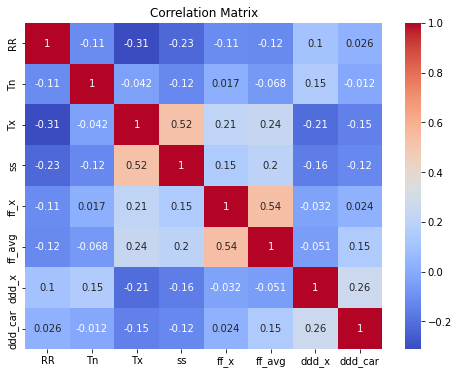

In [38]:
corrM_df_filled = df_filled.corr()
plot_correlation_matrix(corrM=corrM_df_filled)

There are no features that have a correlation matrix equal to or more than 7, so there are no features that need further analysis to be eliminated.

## Data Normalization

In [39]:
from sklearn.preprocessing import MinMaxScaler
scaler_df_cleaned = MinMaxScaler()
scaler_df_cleaned = scaler_df_cleaned.fit(df_clean)

In [40]:
print("Maximum value of each column:", scaler_df_cleaned.data_max_)
print("Minimum value of each column:",scaler_df_cleaned.data_min_)

Maximum value of each column: [213.9  27.9  36.8  11.   13.    5.  360.    8. ]
Minimum value of each column: [ 0.  19.  23.8  0.   1.   0.   0.   0. ]


In [41]:
scaler_df_filled = MinMaxScaler()
scaler_df_filled = scaler_df_filled.fit(df_filled)

In [42]:
print("Maximum value of each column:", scaler_df_cleaned.data_max_)
print("Minimum value of each column:",scaler_df_cleaned.data_min_)

Maximum value of each column: [213.9  27.9  36.8  11.   13.    5.  360.    8. ]
Minimum value of each column: [ 0.  19.  23.8  0.   1.   0.   0.   0. ]


In [43]:
df_clean_normalized = scaler_df_cleaned.transform(df_clean)
df_filled_normalized = scaler_df_filled.transform(df_filled)

In [44]:
df_clean_normalized = pd.DataFrame(df_clean_normalized, columns=df_clean.columns)
df_filled_normalized = pd.DataFrame(df_filled_normalized, columns=df_filled.columns)

In [45]:
df_clean_normalized

,RR,Tn,Tx,ss,ff_x,ff_avg,ddd_x,ddd_car
0,0.010285,0.584270,0.553846,0.436364,0.166667,0.4,0.750000,0.125
1,0.091632,0.584270,0.584615,0.381818,0.166667,0.4,1.000000,0.250
2,0.164563,0.505618,0.523077,0.090909,0.166667,0.4,1.000000,0.250
3,0.081346,0.471910,0.592308,0.072727,0.250000,0.4,1.000000,0.125
4,0.107527,0.449438,0.430769,0.000000,0.166667,0.4,0.500000,0.625
...,...,...,...,...,...,...,...,...
2398,0.001403,0.539326,0.607692,0.127273,0.166667,0.2,0.500000,0.875
2399,0.022908,0.606742,0.630769,0.572727,0.250000,0.4,0.555556,0.000
2400,0.059374,0.595506,0.400000,0.827273,0.083333,0.2,0.833333,0.000
2401,0.008883,0.561798,0.476923,0.000000,0.166667,0.4,0.694444,1.000


In [46]:
df_filled_normalized

,RR,Tn,Tx,ss,ff_x,ff_avg,ddd_x,ddd_car
0,0.010285,0.584270,0.521739,0.068571,0.10,0.4,0.750000,0.125
1,0.091632,0.584270,0.550725,0.060000,0.10,0.4,1.000000,0.250
2,0.000000,0.651685,0.492754,0.015714,0.15,0.4,0.750000,0.250
3,0.164563,0.505618,0.492754,0.014286,0.10,0.4,1.000000,0.250
4,0.081346,0.471910,0.557971,0.011429,0.15,0.4,1.000000,0.125
...,...,...,...,...,...,...,...,...
3543,0.001403,0.539326,0.572464,0.020000,0.10,0.2,0.500000,0.875
3544,0.022908,0.606742,0.594203,0.090000,0.15,0.4,0.555556,0.000
3545,0.059374,0.595506,0.376812,0.130000,0.05,0.2,0.833333,0.000
3546,0.008883,0.561798,0.449275,0.000000,0.10,0.4,0.694444,1.000


## New Dataframe Creation

In [47]:
df_lean_dict = df_clean_normalized.to_dict(orient='list')
df_filled_dict = df_filled_normalized.to_dict(orient='list')

In [48]:
# The function creates a new dataframe according to the input output format
def new_dataframe_input_output(df_dict):
    input_data = []
    output_data = []
    for i in range(len(df_dict['RR']) - 8):
        input_data.append([
            df_dict['RR'][i], 
            df_dict['Tn'][i], 
            df_dict['Tx'][i], 
            df_dict['ss'][i], 
            df_dict['ff_x'][i],
            df_dict['ff_avg'][i],
            df_dict['ddd_x'][i],
            df_dict['ddd_car'][i]
        ])
        output_data.append([
            df_dict['RR'][i], 
            df_dict['RR'][i+1], 
            df_dict['RR'][i+2], 
            df_dict['RR'][i+3], 
            df_dict['RR'][i+4], 
            df_dict['RR'][i+5], 
            df_dict['RR'][i+6], 
            df_dict['RR'][i+7],
        ])
        return input_data, output_data

In [49]:
def new_dataframe_input_output(df_dict):
    input_data = []
    output_data = []
    for i in range(len(df_dict['RR']) - 8):
        input_data.append(list(df_dict[key][i] for key in ['RR', 'Tn', 'Tx', 'ss', 'ff_x', 'ff_avg', 'ddd_x', 'ddd_car']))
        output_data.append(list(df_dict['RR'][i+j] for j in range(8)))
    return input_data, output_data


In [50]:
df_clean_input, df_clean_output = new_dataframe_input_output(df_lean_dict)
df_filled_input, df_filled_output = new_dataframe_input_output(df_filled_dict)

In [51]:
df_clean_input = pd.DataFrame(df_clean_input, columns=['RR', 'Tn', 'Tx', 'ss', 'ff_x', 'ff_avg', 'ddd_x', 'ddd_car'])
df_clean_output = pd.DataFrame(df_clean_output, columns=['RR','RR+1', 'RR+2', 'RR+3', 'RR+4', 'RR+5', 'RR+6', 'RR+7'])

In [52]:
df_filled_input = pd.DataFrame(df_filled_input, columns=['RR', 'Tn', 'Tx', 'ss', 'ff_x', 'ff_avg', 'ddd_x', 'ddd_car'])
df_filled_output = pd.DataFrame(df_filled_output, columns=['RR','RR+1', 'RR+2', 'RR+3', 'RR+4', 'RR+5', 'RR+6', 'RR+7'])

In [53]:
df_clean_input

,RR,Tn,Tx,ss,ff_x,ff_avg,ddd_x,ddd_car
0,0.010285,0.584270,0.553846,0.436364,0.166667,0.4,0.750000,0.125
1,0.091632,0.584270,0.584615,0.381818,0.166667,0.4,1.000000,0.250
2,0.164563,0.505618,0.523077,0.090909,0.166667,0.4,1.000000,0.250
3,0.081346,0.471910,0.592308,0.072727,0.250000,0.4,1.000000,0.125
4,0.107527,0.449438,0.430769,0.000000,0.166667,0.4,0.500000,0.625
...,...,...,...,...,...,...,...,...
2390,0.036466,0.584270,0.430769,0.136364,0.416667,0.4,0.500000,0.000
2391,0.008883,0.516854,0.415385,0.136364,0.250000,0.4,0.500000,0.625
2392,0.039738,0.539326,0.492308,0.109091,0.250000,0.4,0.166667,0.000
2393,0.286583,0.404494,0.338462,0.236364,0.250000,0.4,0.750000,1.000


In [54]:
df_clean_output

,RR,RR+1,RR+2,RR+3,RR+4,RR+5,RR+6,RR+7
0,0.010285,0.091632,0.164563,0.081346,0.107527,0.085554,0.001403,0.139785
1,0.091632,0.164563,0.081346,0.107527,0.085554,0.001403,0.139785,0.044413
2,0.164563,0.081346,0.107527,0.085554,0.001403,0.139785,0.044413,0.000000
3,0.081346,0.107527,0.085554,0.001403,0.139785,0.044413,0.000000,0.041608
4,0.107527,0.085554,0.001403,0.139785,0.044413,0.000000,0.041608,0.007948
...,...,...,...,...,...,...,...,...
2390,0.036466,0.008883,0.039738,0.286583,0.084151,0.049088,0.170173,0.499766
2391,0.008883,0.039738,0.286583,0.084151,0.049088,0.170173,0.499766,0.001403
2392,0.039738,0.286583,0.084151,0.049088,0.170173,0.499766,0.001403,0.022908
2393,0.286583,0.084151,0.049088,0.170173,0.499766,0.001403,0.022908,0.059374


In [55]:
df_filled_input

,RR,Tn,Tx,ss,ff_x,ff_avg,ddd_x,ddd_car
0,0.010285,0.584270,0.521739,0.068571,0.10,0.4,0.750000,0.125
1,0.091632,0.584270,0.550725,0.060000,0.10,0.4,1.000000,0.250
2,0.000000,0.651685,0.492754,0.015714,0.15,0.4,0.750000,0.250
3,0.164563,0.505618,0.492754,0.014286,0.10,0.4,1.000000,0.250
4,0.081346,0.471910,0.557971,0.011429,0.15,0.4,1.000000,0.125
...,...,...,...,...,...,...,...,...
3535,0.286583,0.404494,0.318841,0.037143,0.15,0.4,0.750000,1.000
3536,0.000000,0.471910,0.239130,0.000000,0.10,0.2,0.166667,0.375
3537,0.084151,0.449438,0.492754,0.000000,0.15,0.4,0.750000,1.000
3538,0.000000,0.573034,0.536232,0.062857,0.10,0.4,0.555556,0.625


In [56]:
df_filled_output

,RR,RR+1,RR+2,RR+3,RR+4,RR+5,RR+6,RR+7
0,0.010285,0.091632,0.000000,0.164563,0.081346,0.107527,0.000000,0.085554
1,0.091632,0.000000,0.164563,0.081346,0.107527,0.000000,0.085554,0.001403
2,0.000000,0.164563,0.081346,0.107527,0.000000,0.085554,0.001403,0.139785
3,0.164563,0.081346,0.107527,0.000000,0.085554,0.001403,0.139785,0.044413
4,0.081346,0.107527,0.000000,0.085554,0.001403,0.139785,0.044413,0.000000
...,...,...,...,...,...,...,...,...
3535,0.286583,0.000000,0.084151,0.000000,0.049088,0.170173,0.000000,0.499766
3536,0.000000,0.084151,0.000000,0.049088,0.170173,0.000000,0.499766,0.001403
3537,0.084151,0.000000,0.049088,0.170173,0.000000,0.499766,0.001403,0.022908
3538,0.000000,0.049088,0.170173,0.000000,0.499766,0.001403,0.022908,0.059374


In [57]:
# Changing the input and output data format according to the LSTM-based model
def create_dataset(input_data, output_data, n_steps):
    X, y = [], []
    for i in range(len(input_data) - n_steps):
        X.append(input_data[i:i + n_steps])
        y.append(output_data[i + n_steps])
    return np.array(X), np.array(y)


In [58]:
# Changed a clean DataFrame to a numpy array
df_clean_input_array = df_clean_input.to_numpy()
df_clean_output_array = df_clean_output.to_numpy()

# Changed DataFrame filled to numpy array
df_filled_input_array = df_filled_input.to_numpy()
df_filled_output_array = df_filled_output.to_numpy()


In [59]:
# Splitting clean DataFrame into training data and test data (80:20)
df_clean_train_size = int(len(df_clean_input_array) * 0.8)
df_clean_test_size = len(df_clean_input_array) - df_clean_train_size
df_clean_train_input, df_clean_test_input = df_clean_input_array[0:df_clean_train_size], df_clean_input_array[df_clean_train_size:len(df_clean_input_array)]
df_clean_train_output, df_clean_test_output = df_clean_output_array[0:df_clean_train_size], df_clean_output_array[df_clean_train_size:len(df_clean_output_array)]

In [60]:
# Splitting DataFrame filled into training data and test data (80:20)
df_filled_train_size = int(len(df_filled_input_array) * 0.8)
df_filled_test_size = len(df_filled_input_array) - df_filled_train_size
df_filled_train_input, df_filled_test_input = df_filled_input_array[0:df_filled_train_size], df_filled_input_array[df_filled_train_size:len(df_filled_input_array)]
df_filled_train_output, df_filled_test_output = df_filled_input_array[0:df_filled_train_size], df_filled_input_array[df_filled_train_size:len(df_filled_input_array)]

In [61]:
n_steps = 1
# Create a df_clean dataset
df_clean_train_input, df_clean_train_output = create_dataset(df_clean_train_input, df_clean_train_output, n_steps)
df_clean_test_input, df_clean_test_output = create_dataset(df_clean_test_input, df_clean_test_output, n_steps)
# Create a df_filled dataset
df_filled_train_input, df_filled_train_output = create_dataset(df_filled_train_input, df_filled_train_output, n_steps)
df_filled_test_input, df_filled_test_output = create_dataset(df_filled_test_input, df_filled_test_output, n_steps)

In [62]:
print('Shape df_clean_train_input:', df_clean_train_input.shape)
print('Shape df_clean_train_outpu:', df_clean_train_output.shape)
print('Shape df_clean_test_input:', df_clean_test_input.shape)
print('Shape df_clean_test_output:', df_clean_test_output.shape)
print('')
print('Form df_filled_train_input:', df_filled_train_input.shape)
print('Form df_filled_train_output:', df_filled_train_output.shape)
print('Form df_filled_test_input:', df_filled_test_input.shape)
print('Form df_filled_test_output:', df_filled_test_output.shape)

Shape df_clean_train_input: (1915, 1, 8)
Shape df_clean_train_outpu: (1915, 8)
Shape df_clean_test_input: (478, 1, 8)
Shape df_clean_test_output: (478, 8)

Form df_filled_train_input: (2831, 1, 8)
Form df_filled_train_output: (2831, 8)
Form df_filled_test_input: (707, 1, 8)
Form df_filled_test_output: (707, 8)


# Implementation of LSTM Based Model with GWO Algorithm

In [63]:
# Definition of RMSLE and RMSE
import tensorflow.keras.backend as K

def rmsle(y_true, y_pred):
    return K.sqrt(K.mean(K.square(K.log(y_pred + 1) - K.log(y_true + 1))))  
       
def rmse(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

## Model with GWO algorithm

In [64]:
from numpy import array
from numpy.random import uniform as np_uniform
from pandas import DataFrame as DF
from random import uniform

class GWO:
	def __init__(self, n, a, b, c, learning_rate = 0.001): # bound
		assert(0 < a < b < c < 1)
		self.n = n
		self.a = a
		self.b = b
		self.c = c
		self.learning_rate = learning_rate
		self.lb = 0
		self.ub = 1
		self.use_np = True
		self.na = int(n * a)
		self.nb = int(n * (b - a))
		self.nc = int(n * (c - b))
		self.nd = self.n - self.na - self.nb - self.nc
		self.lists = [						\
			[self.generator(0, a) for _ in range(self.na)], 		\
			[self.generator(a, b) for _ in range(self.nb)], 		\
			[self.generator(b, c) for _ in range(self.nc)], 		\
			[self.generator(c, 1) for _ in range(self.nd)], 		\
		] # generate the four layers
		self.X = sorted([self.generator(self.lb, self.ub) for _ in range(n)])
	def _generator(self):
		return np_uniform if self.use_np else uniform
	def generator(self, a, b):
		return np_uniform(a, b) if self.use_np else uniform(a, b)
	def update(self, t):
		self.lists[3] = abs(array(self.lists[2]) * abs(self.X[min(len(self.X) - 1, t)]) - self.X[min(len(self.X) - 1, t)]).tolist()
		if t >= len(self.X): # sifted out
			del self.X[0]
			self.X.append(self.generator(self.lb, self.ub))
			self.c -= 1 / self.n
		for i in range(len(self.lists) - 1):
			self.lists[3] = abs(self.lists[3][t % len(self.lists[3])] * array(self.lists[i]) - self.X[min(self.n - 1, t)]).tolist()
		tmp_a = array(self.X[:self.na])
		tmp_b = (array(self.lists[0]) * array([self.lists[3]]).T)[0]
		tmp_c = array(self.X[self.na:self.na + self.nb])
		tmp_d = (array(self.lists[1]) * array([self.lists[3]]).T)[0]
		tmp_e = array(self.X[self.nb:self.nb + self.nc])
		tmp_f = (array(self.lists[2]) * array([self.lists[3]]).T)[0]
		self.X.append(													\
			(													\
				(tmp_a - tmp_b).tolist()[0]		\
				+ (tmp_c - tmp_d).tolist()[0]		\
				+ (tmp_e - tmp_f).tolist()[0]		\
			) / 3													\
		)
		self.learning_rate = abs(self.X[-1] - self.X[-2])
	def fix(self, test, predict, lb = 0, ub = 1, layer = None):
		if layer is None: # do not use gwo
			return (test - predict) * self.get((lb, ub))
		else:
			return (test - predict) * self.get((layer, ))
	def get(self, target):
		if "A" == target:
			return self.lists[0]
		elif "B" == target:
			return self.lists[1]
		elif "C" == target:
			return self.lists[2]
		elif "D" == target:
			return self.lists[3]
		elif 1== target or "a" == target or "alpha" == str(target).lower() or target is None:
			return self.a
		elif 2 == target or "b" == target or "beta" == str(target).lower():
			return self.b
		elif 3 == target or "c" == target or "gamma" == str(target).lower():
			return self.c
		elif type(target) == tuple:
			if 1 == len(target):
				layer = target[0]
				return self.generator(self.get(layer) + (1 - self.get("gamma")) * self.get("alpha"), self.get(layer) + (1 - self.get(layer + 1)) * self.get(layer))
			if 2 == len(target):
				return self.generator(target[0], target[1])
			else:
				return None
		else:
			return None

	def train_model(self, model, X_train, y_train, X_val, y_val, name, config):

		# Mengatur optimizer dengan learning rate
		learning_rate = 0.001
		optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)
		
		model.compile(loss=tf.keras.losses.Huber(), optimizer=optimizer, metrics=['mae', rmsle, rmse])
		print(X_train.shape, y_train.shape)
		hist = model.fit(
			X_train, y_train,
			batch_size = config["batch"],
			epochs = config["epochs"],
			validation_data=(X_val, y_val),
			steps_per_epoch=100,
			verbose=1
		)
		model.save('model/' + name + '.h5')
		pf = DF.from_dict(hist.history)
		pf.to_csv('model/' + name + ' loss.csv', encoding = 'utf-8', index = False)

## LSTM Based Model

In [65]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional
class based_model:
    def get_lstm_ver1(units):
        """LSTM(Long Short-Term Memory)
        Build LSTM Model.
        # Arguments
            units: List(int), number of input, output and hidden units.
        # Returns
            model: Model, nn model.
        """
        
        model = Sequential()
        model.add(LSTM(units = 50, input_shape=(units[0], units[1]), return_sequences=True, activation='tanh'))
        model.add(LSTM(units = 50, return_sequences=True, activation='tanh'))
        model.add(LSTM(units = 50, activation='tanh'))
        model.add(Dense(units[2], activation='sigmoid'))

        return model


    def get_lstm_ver2(units):
        """LSTM(Long Short-Term Memory)
        Build LSTM Model.
        # Arguments
            units: List(int), number of input, output and hidden units.
        # Returns
            model: Model, nn model.
        """
        
        model = Sequential()
        model.add(LSTM(units[1], input_shape=(units[0], units[1]), return_sequences=True, activation='tanh'))
        model.add(LSTM(units[2], activation='tanh'))
        model.add(Dropout(0.2))
        model.add(Dense(units[3], activation='sigmoid'))

        return model

    def get_lstm_ver3(units):
        """LSTM(Long Short-Term Memory)
        Build LSTM Model.
        # Arguments
            units: List(int), number of input, output and hidden units.
        # Returns
            model: Model, nn model.
        """
        
        model = Sequential()
        model.add(LSTM(units = 150, input_shape=(units[0], units[1]), return_sequences=True, activation='tanh'))
        model.add(Dropout(0.2))
        model.add(LSTM(units = 100, return_sequences=False, activation='tanh'))
        model.add(Dropout(0.2))
        model.add(Dense(units[2], activation='sigmoid'))

        return model

    def get_blstm(units):
        """Bidirectional-LSTM(Long Short-Term Memory)
        Build BLSTM Model.
        # Arguments
            units: List(int), number of input, output and hidden units.
        # Returns
            model: Model, nn model.
        """

        model = Sequential()
        model.add(Bidirectional(LSTM(150, return_sequences=True), input_shape=(units[0], units[1])))
        model.add(Bidirectional(LSTM(50)))
        model.add(Dense(20, activation='tanh'))
        model.add(Dropout(0.2))
        model.add(Dense(units[2], activation='sigmoid'))

        return model

    def train_model(model, X_train, y_train, X_val, y_val, name, config):
        # Mengatur optimizer dengan learning rate
        learning_rate = 0.001
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)


        model.compile(
            loss=tf.keras.losses.Huber(), 
            optimizer='adam', 
            metrics=['mae', rmsle, rmse]
            )
            
        print(X_train.shape, y_train.shape)
        hist = model.fit(
            X_train, y_train,
            batch_size = config["batch"],
            epochs = config["epochs"],
            validation_data=(X_val, y_val),
            steps_per_epoch=100,
            verbose=1
        )
        model.save('model/' + name + '.h5')
        pf = DF.from_dict(hist.history)
        pf.to_csv('model/' + name + ' loss.csv', encoding = 'utf-8', index = False)

# Model Experiments

In [66]:
config_1 = {"batch": 16, "epochs": 200}
config_2 = {"batch": 32, "epochs": 200}

## Model Experiments With the df_clean Dataset

In [67]:
model_lstm_ver1 = based_model.get_lstm_ver1([n_steps, df_clean_train_input.shape[2], df_clean_train_output.shape[1]])
model_lstm_ver2 = based_model.get_lstm_ver2([n_steps, df_clean_train_input.shape[2], 64, df_clean_train_output.shape[1]])
model_lstm_ver3 = based_model.get_lstm_ver3([n_steps, df_clean_train_input.shape[2], df_clean_train_output.shape[1]])
model_blstm = based_model.get_blstm([n_steps, df_clean_train_input.shape[2], df_clean_train_output.shape[1]])

### Model Architecture With df_clean Dataset

In [ ]:
model_lstm_ver1.summary()

In [ ]:
model_lstm_ver2.summary()

In [ ]:
model_lstm_ver3.summary()

In [ ]:
model_blstm.summary()

### Training Model With df_clean Dataset

#### Based Model config_1

In [ ]:
based_model.train_model(model_lstm_ver1, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_lstm_ver1_df_clean_config_1', config_1)

In [ ]:
based_model.train_model(model_lstm_ver2, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_lstm_ver2_df_clean_config_1', config_1)

In [ ]:
based_model.train_model(model_lstm_ver3, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_lstm_ver3_df_clean_config_1', config_1)

In [ ]:
based_model.train_model(model_blstm, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_blstm_df_clean_config_1', config_1)

#### Based Model config_2

In [ ]:
based_model.train_model(model_lstm_ver1, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_lstm_ver1_df_clean_config_2', config_2)

In [ ]:
based_model.train_model(model_lstm_ver2, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_lstm_ver2_df_clean_config_2', config_2)

In [ ]:
based_model.train_model(model_lstm_ver3, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_lstm_ver3_df_clean_config_2', config_2)

In [ ]:
based_model.train_model(model_blstm, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_blstm_df_clean_config_2', config_2)

In [ ]:
gwo = GWO(576, 0.4, 0.7, 0.9)

#### Based Model + GWO config_1

In [ ]:
gwo.train_model(model_lstm_ver1, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_lstm_ver1_gwo_df_clean_config_1', config_1)

In [ ]:
gwo.train_model(model_lstm_ver2, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_lstm_ver2_gwo_df_clean_config_1', config_1)

In [ ]:
gwo.train_model(model_lstm_ver3, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_lstm_ver3_gwo_df_clean_config_1', config_1)

In [ ]:
gwo.train_model(model_blstm, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_blstm_gwo_df_clean_config_1', config_1)

#### Based Model + GWO config_2

In [ ]:
gwo.train_model(model_lstm_ver1, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_lstm_ver1_gwo_df_clean_config_2', config_2)

In [ ]:
gwo.train_model(model_lstm_ver2, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_lstm_ver2_gwo_df_clean_config_2', config_2)

In [ ]:
gwo.train_model(model_lstm_ver3, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_lstm_ver3_gwo_df_clean_config_2', config_2)

In [ ]:
gwo.train_model(model_blstm, df_clean_train_input, df_clean_train_output, df_clean_test_input, df_clean_test_output, 'model_blstm_gwo_df_clean_config_2', config_2)

## Model Experiments With the df_filled Dataset

In [ ]:
model_lstm_ver1_df_filled = based_model.get_lstm_ver1([n_steps, df_filled_train_input.shape[2], df_filled_train_output.shape[1]])
model_lstm_ver2_df_filled = based_model.get_lstm_ver2([n_steps, df_filled_train_input.shape[2], 64, df_filled_train_output.shape[1]])
model_lstm_ver3_df_filled = based_model.get_lstm_ver3([n_steps, df_filled_train_input.shape[2], df_filled_train_output.shape[1]])
model_blstm_df_filled = based_model.get_blstm([n_steps, df_filled_train_input.shape[2], df_filled_train_output.shape[1]])

### Model Architecture With Dataset df_filled

In [ ]:
model_lstm_ver1_df_filled.summary()

In [ ]:
model_lstm_ver2_df_filled.summary()

In [ ]:
model_lstm_ver3_df_filled.summary()

In [ ]:
model_blstm_df_filled.summary()

### Training Model With Dataset df_filled

#### Based Model config_1

In [ ]:
based_model.train_model(model_lstm_ver1_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_lstm_ver1_df_filled_config_1', config_1)


In [ ]:
based_model.train_model(model_lstm_ver2_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_lstm_ver2_df_filled_config_1', config_1)


In [ ]:
based_model.train_model(model_lstm_ver3_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_lstm_ver3_df_filled_config_1', config_1)


In [ ]:
based_model.train_model(model_blstm_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_blstm_df_filled_config_1', config_1)

#### Based Model config_2

In [ ]:
based_model.train_model(model_lstm_ver1_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_lstm_ver1_df_filled_config_2', config_2)


In [ ]:
based_model.train_model(model_lstm_ver2_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_lstm_ver2_df_filled_config_2', config_2)


In [ ]:
based_model.train_model(model_lstm_ver3_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_lstm_ver3_df_filled_config_2', config_2)


In [ ]:
based_model.train_model(model_blstm_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_blstm_df_filled_config_2', config_2)


#### Based Model + GWO config_1

In [ ]:
gwo = GWO(576, 0.4, 0.7, 0.9)

In [ ]:
gwo.train_model(model_lstm_ver1_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_lstm_ver1_gwo_df_filled_config_1', config_1)


In [ ]:
gwo.train_model(model_lstm_ver2_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_lstm_ver2_gwo_df_filled_config_1', config_1)


In [ ]:
gwo.train_model(model_lstm_ver3_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_lstm_ver3_gwo_df_filled_config_1', config_1)


In [ ]:
gwo.train_model(model_blstm_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_blstm_gwo_df_filled_config_1', config_1)


#### Based Model + GWO config_2

In [ ]:
gwo.train_model(model_lstm_ver1_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_lstm_ver1_gwo_df_filled_config_2', config_2)


In [ ]:
gwo.train_model(model_lstm_ver2_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_lstm_ver2_gwo_df_filled_config_2', config_2)


In [ ]:
gwo.train_model(model_lstm_ver3_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_lstm_ver3_gwo_df_filled_config_2', config_2)


In [ ]:
gwo.train_model(model_blstm_df_filled, df_filled_train_input, df_filled_train_output, df_filled_test_input, df_filled_test_output, 'model_blstm_gwo_df_filled_config_2', config_2)